In [1]:
!pip install opendatasets -q

In [2]:
!pip install tensorflow -q

In [33]:
# Library untuk manipulasi data dan analisis numerik
import pandas as pd
import numpy as np

# Library untuk plotting dan visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

# Library untuk pengolahan dan manipulasi gambar
import cv2
from PIL import Image

# Library untuk operasi sistem, manipulasi file dan direktori, serta handling file zip
import zipfile
import os
import shutil
import random

# Library untuk clustering, contoh K-Means clustering
from sklearn.cluster import KMeans

# Library untuk augmentasi dan preprocessing gambar pada deep learning dengan Keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Library untuk mengabaikan peringatan agar output lebih bersih
import warnings
warnings.filterwarnings('ignore')

# Library untuk progress bar saat iterasi panjang
from tqdm import tqdm

# Library data loading
import opendatasets as od

# Library untuk permodelan DL
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score


# **Loading Dataset**

In [4]:
kaggle = {"username":"samsulpoetry","key":"7b6651928aa74134cc42ea304f4eb389"}

In [5]:
od.download('https://www.kaggle.com/datasets/niten19/face-shape-dataset')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: samsulpoetry
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/niten19/face-shape-dataset


100%|██████████| 639M/639M [00:06<00:00, 98.2MB/s]

In [6]:
# Tentukan path ke dataset yang diunduh
dataset_path = '/content/face-shape-dataset/FaceShape Dataset/'
train_path = os.path.join(dataset_path, 'training_set')
test_path = os.path.join(dataset_path, 'testing_set')
output_path = 'face-shape-hijabist'

# Buat folder output jika belum ada
if not os.path.exists(output_path):
    os.makedirs(output_path)

# Fungsi untuk menyalin file dari sumber ke tujuan
def copy_files(src_dir, dest_dir):
    for root, _, files in os.walk(src_dir):
        for file in files:
            if file.lower() == 'desktop.ini': # Tambahkan pengecekan ini
                continue # Lewati file desktop.ini
            src_file = os.path.join(root, file)
            # Buat struktur direktori yang sama di folder output
            relative_path = os.path.relpath(src_file, src_dir)
            dest_file = os.path.join(dest_dir, relative_path)
            # Pastikan direktori tujuan ada
            os.makedirs(os.path.dirname(dest_file), exist_ok=True)
            # Salin file
            shutil.copy2(src_file, dest_file)

# Salin file dari folder training
print(f"Menyalin file dari: {train_path}")
copy_files(train_path, output_path)
print("Selesai menyalin file training.")

# Salin file dari folder testing
print(f"Menyalin file dari: {test_path}")
copy_files(test_path, output_path)
print("Selesai menyalin file testing.")

print(f"Dataset gabungan disimpan di: {output_path}")

Menyalin file dari: /content/face-shape-dataset/FaceShape Dataset/training_set
Selesai menyalin file training.
Menyalin file dari: /content/face-shape-dataset/FaceShape Dataset/testing_set
Selesai menyalin file testing.
Dataset gabungan disimpan di: face-shape-hijabist


# **Exploratory Data Analysis (EDA)**

In [7]:
# Cek isi folder
datasets = './face-shape-hijabist'
print("\nIsi dalam dataset:")
print(os.listdir(datasets))


Isi dalam dataset:
['Square', 'Oval', 'Oblong', 'Heart', 'Round']


Distribusi jumlah gambar per kelas: {'Square': 1000, 'Oval': 1000, 'Oblong': 1000, 'Heart': 1000, 'Round': 1000}


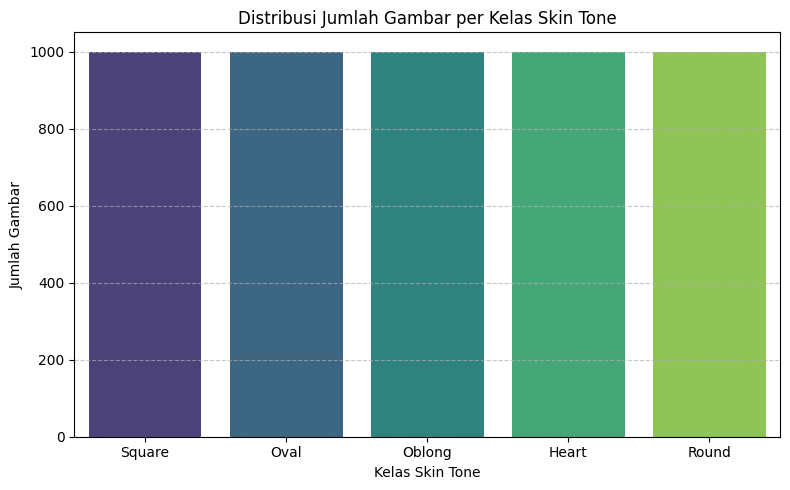

In [8]:
def count_images_per_class(dataset_path):
    """
    Mengembalikan dictionary jumlah gambar (.jpg/.png/.jpeg) per kelas dari dataset.
    """
    return {
        class_name: len([
            f for f in os.listdir(os.path.join(dataset_path, class_name))
            if os.path.isfile(os.path.join(dataset_path, class_name, f)) and
               f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        for class_name in os.listdir(dataset_path)
        if os.path.isdir(os.path.join(dataset_path, class_name))
    }

# Hitung jumlah gambar per kelas
class_counts = count_images_per_class(datasets)

# Cetak hasil
print("Distribusi jumlah gambar per kelas:", class_counts)

# Visualisasi distribusi kelas
plt.figure(figsize=(8, 5))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')
plt.title('Distribusi Jumlah Gambar per Kelas Skin Tone')
plt.xlabel('Kelas Skin Tone')
plt.ylabel('Jumlah Gambar')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

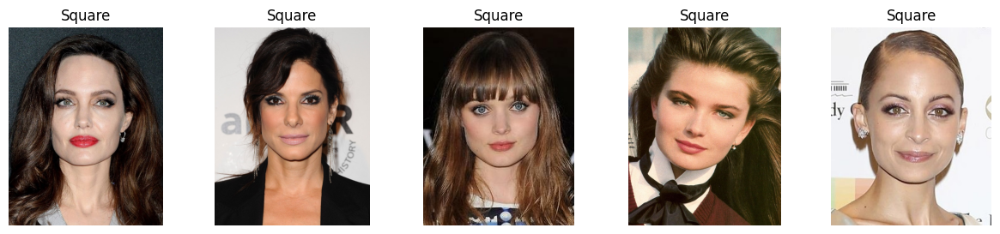

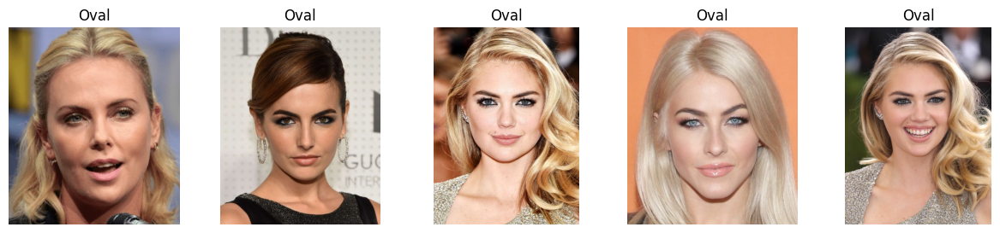

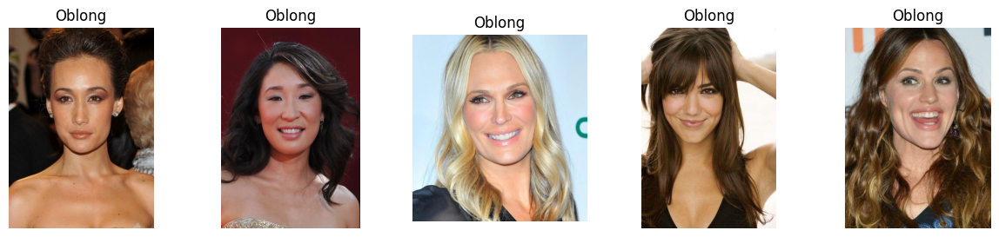

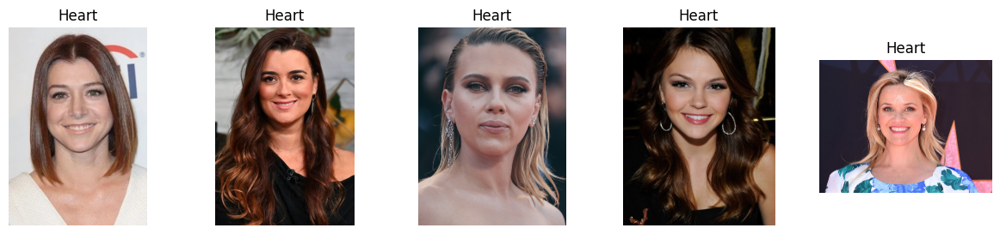

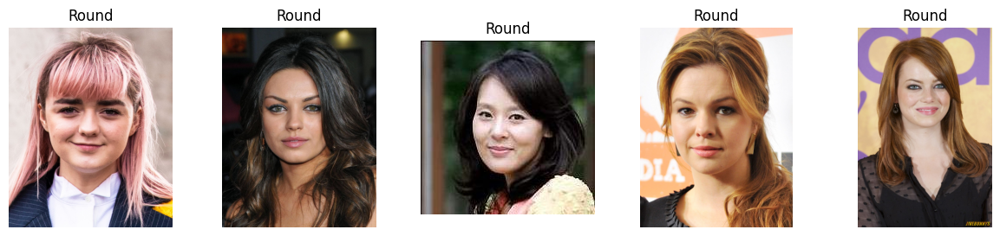

In [9]:
#Visualisasi gambar di setiap kelasnya
def show_samples(datasets, class_name, n=5):
    folder = os.path.join(datasets, class_name)
    images = os.listdir(folder)[:n]
    plt.figure(figsize=(15, 3))
    for i, img_file in enumerate(images):
        img_path = os.path.join(folder, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()

for skin_class in os.listdir(datasets):
    show_samples(datasets, skin_class)

In [10]:
def check_image_sizes(dataset_path):
    """
    Mengumpulkan ukuran (width, height) semua gambar dalam dataset dan menampilkan statistik deskriptif.
    """
    sizes = []
    for skin_class in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, skin_class)
        if not os.path.isdir(class_path):
            continue

        for file in os.listdir(class_path):
            img_path = os.path.join(class_path, file)
            try:
                with Image.open(img_path) as img:
                    sizes.append(img.size)
            except Exception as e:
                print(f"Error membuka gambar {img_path}: {e}")

    sizes_df = pd.DataFrame(sizes, columns=['Width', 'Height'])
    print(sizes_df.describe())
    return sizes_df

# Cek Ukuran Gambar
sizes_df = check_image_sizes(datasets)

             Width      Height
count  5000.000000  5000.00000
mean    573.766200   736.24080
std     422.799825   560.73446
min     101.000000   131.00000
25%     307.000000   400.00000
50%     450.000000   578.00000
75%     682.000000   866.50000
max    6659.000000  9999.00000


Insight:
1. Ukuran gambar perlu di resize dan disamakan ke 224*224 agar cocok ke pretrained model
2. Gambar masih dipengaruhi bagian wajah lain, background dan komponen yang tidak sesuai untuk klasifikasi face shape maka perlu di cropping agar fokus di bagian dagu dan garis rahang saja.
3. distribusi data masih sudah seimbang. Namun, augmentasi tetap diperlukan untuk setiap kelas untuk robustness model

# **Data Preparation**



## **Cropping Image**

In [45]:
!pip install dlib opencv-python -q
import os
import urllib.request
import bz2
import dlib

In [46]:
url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
bz2_path = 'shape_predictor_68_face_landmarks.dat.bz2'
dat_path = 'shape_predictor_68_face_landmarks.dat'

# Download jika belum ada
if not os.path.exists(dat_path):
    print("Downloading predictor...")
    urllib.request.urlretrieve(url, bz2_path)

    print("Extracting predictor...")
    with bz2.BZ2File(bz2_path) as fr, open(dat_path, 'wb') as fw:
        fw.write(fr.read())

    os.remove(bz2_path)
    print("Done.")
else:
    print("Predictor file already exists.")

Extracting predictor...
Done.


In [47]:
def crop_facial_features(source_dir, output_dir, predictor_path):
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(predictor_path)
    total = 0
    failed = []

    os.makedirs(output_dir, exist_ok=True)

    for class_name in os.listdir(source_dir):
        class_input_path = os.path.join(source_dir, class_name)
        class_output_path = os.path.join(output_dir, class_name)

        if not os.path.isdir(class_input_path):
            continue

        os.makedirs(class_output_path, exist_ok=True)

        image_files = [f for f in os.listdir(class_input_path)
                       if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        for img_name in tqdm(image_files, desc=f"Processing {class_name}"):
            input_path = os.path.join(class_input_path, img_name)
            output_path = os.path.join(class_output_path, img_name)

            try:
                img = cv2.imread(input_path)
                if img is None:
                    raise Exception("Image not readable")

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                faces = detector(gray)

                if not faces:
                    raise Exception("No face detected")

                face = faces[0]
                landmarks = predictor(gray, face)
                points = np.array([(landmarks.part(i).x, landmarks.part(i).y) for i in range(68)])

                # Ambil fitur penting:
                jaw = points[0:17]
                chin = points[8]
                left_cheek = points[1]
                right_cheek = points[15]
                forehead_center = (points[27][0], points[27][1] - int(abs(points[8][1] - points[27][1]) * 0.6))  # Estimasi dahi

                # Buat bounding box dari atas dahi ke dagu (panjang wajah)
                x1 = min(jaw[:, 0].min(), forehead_center[0]) - 10
                x2 = max(jaw[:, 0].max(), forehead_center[0]) + 10
                y1 = forehead_center[1] - 10
                y2 = chin[1] + 10

                # Clamp ke ukuran gambar
                x1, x2 = max(0, x1), min(img.shape[1], x2)
                y1, y2 = max(0, y1), min(img.shape[0], y2)

                # Crop bagian wajah yang menyertakan dahi hingga dagu
                cropped = img[y1:y2, x1:x2]
                Image.fromarray(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)).save(output_path)
                total += 1

            except Exception as e:
                failed.append(input_path)
                shutil.copy2(input_path, output_path)

    print(f"Cropping complete. Total processed: {total}")
    if failed:
        print(f"Total failed: {len(failed)}")
        for f in failed:
            print(f"- {f}")

In [19]:
crop_facial_features(
    source_dir='/content/face-shape-hijabist',
    output_dir='./face-cropped',
    predictor_path='shape_predictor_68_face_landmarks.dat'
)

Processing Round: 100%|██████████| 1000/1000 [01:20<00:00, 12.36it/s]

Cropping complete. Total processed: 4975
Total failed: 25
- /content/face-shape-hijabist/Oval/oval (849).jpg
- /content/face-shape-hijabist/Oval/oval (748).jpg
- /content/face-shape-hijabist/Oval/oval (750).jpg
- /content/face-shape-hijabist/Oval/oval (708).jpg
- /content/face-shape-hijabist/Oval/oval (687).jpg
- /content/face-shape-hijabist/Oval/oval (698).jpg
- /content/face-shape-hijabist/Oblong/oblong (559).jpg
- /content/face-shape-hijabist/Oblong/oblong (547).jpg
- /content/face-shape-hijabist/Oblong/oblong (619).jpg
- /content/face-shape-hijabist/Oblong/oblong (600).jpg
- /content/face-shape-hijabist/Oblong/oblong (572).jpg
- /content/face-shape-hijabist/Oblong/oblong (753).jpg
- /content/face-shape-hijabist/Oblong/oblong (724).jpg
- /content/face-shape-hijabist/Heart/heart (904).jpg
- /content/face-shape-hijabist/Heart/heart (121).jpg
- /content/face-shape-hijabist/Round/round (404).jpg
- /content/face-shape-hijabist/Round/round (642).jpg
- /content/face-shape-hijabist/Round/ro

In [20]:
datasets_new = '/content/face-cropped'

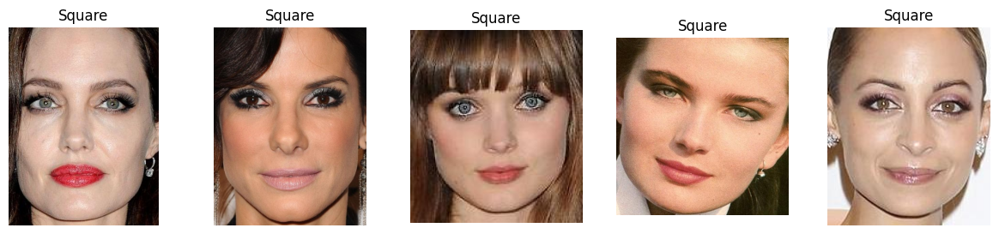

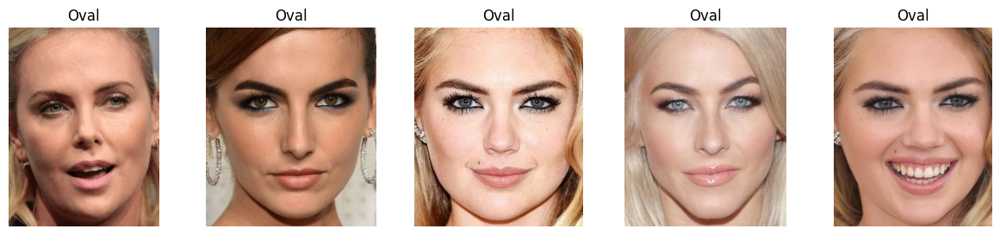

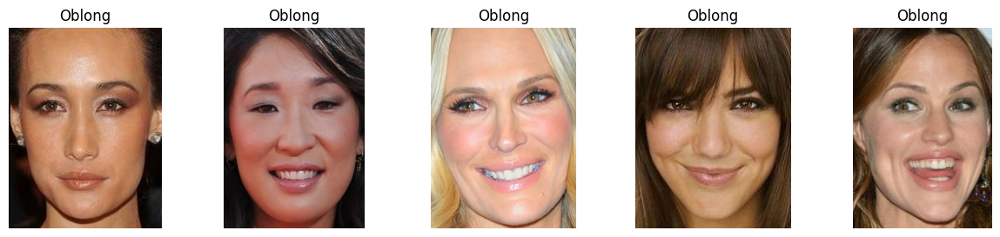

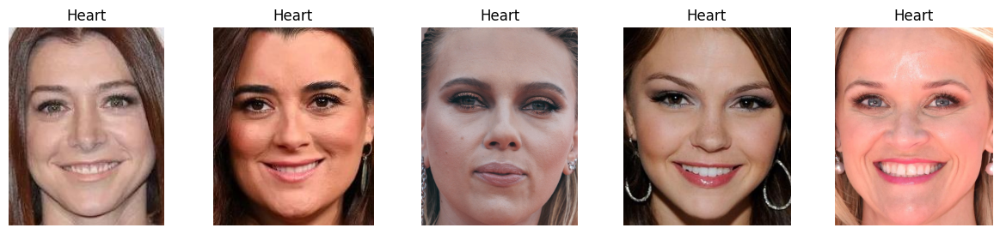

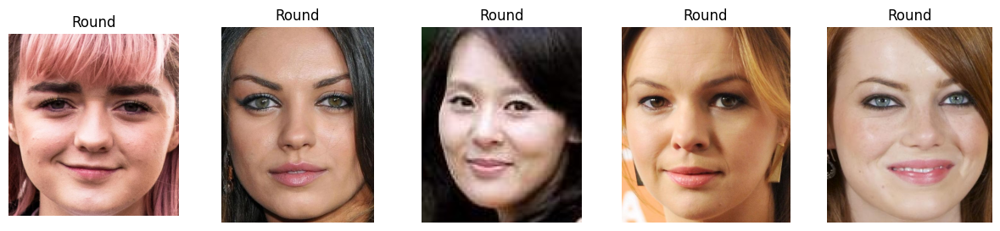

In [21]:
for skin_class in os.listdir(datasets_new):
    show_samples(datasets_new, skin_class)

In [22]:
class_counts = count_images_per_class(datasets_new)

# Cetak hasil
print("Distribusi jumlah gambar per kelas:", class_counts)

Distribusi jumlah gambar per kelas: {'Square': 1000, 'Oval': 1000, 'Oblong': 1000, 'Heart': 1000, 'Round': 1000}


## **Resize Image**

In [23]:
def resize_images(source_dir, output_dir, target_size=(224, 224)):
    """
    Resize semua gambar dari source_dir ke ukuran target dan simpan ke output_dir
    dengan struktur folder kelas yang sama.
    """
    print(f"\nResizing images from {source_dir} to {target_size} and saving to {output_dir}...")
    total_resized = 0
    errored_files = []

    # Buat direktori output utama jika belum ada
    os.makedirs(output_dir, exist_ok=True)

    for class_name in os.listdir(source_dir):
        class_source_path = os.path.join(source_dir, class_name)
        class_output_path = os.path.join(output_dir, class_name) # Path untuk kelas di folder output

        if not os.path.isdir(class_source_path):
            continue

        # Buat direktori kelas di dalam folder output jika belum ada
        os.makedirs(class_output_path, exist_ok=True)

        print(f"  Processing class: {class_name}")
        image_files = [
            f for f in os.listdir(class_source_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]

        for img_file in tqdm(image_files, desc=f"    Resizing {class_name}"):
            source_img_path = os.path.join(class_source_path, img_file)
            # output_img_path = os.path.join(class_output_path, img_file) # Path file output

            try:
                with Image.open(source_img_path) as img:
                    # Konversi ke RGB jika bukan
                    if img.mode != 'RGB':
                        img = img.convert('RGB')

                    # Resize dengan antialiasing
                    try:
                        img_resized = img.resize(target_size, Image.Resampling.LANCZOS)
                    except AttributeError:
                        img_resized = img.resize(target_size, Image.LANCZOS)

                    # Simpan ke folder output baru
                    output_img_path_jpg = os.path.splitext(os.path.join(class_output_path, img_file))[0] + ".jpg"
                    img_resized.save(output_img_path_jpg, format='JPEG', quality=95)

                    total_resized += 1

            except Exception as e:
                print(f"    Error resizing {source_img_path}: {e}")
                errored_files.append(source_img_path)

    print("\nImage resizing complete.")
    print(f"Total images resized: {total_resized}")
    if errored_files:
        print(f"Files with errors during resizing ({len(errored_files)}):")
        for f in errored_files:
            print(f"  - {f}")

In [24]:
resized_dataset = "./dataset-face-shape_resized"

# Jalankan fungsi resize
resize_images(datasets_new, resized_dataset, target_size=(224, 224))


Resizing images from /content/face-cropped to (224, 224) and saving to ./dataset-skin-tone_resized...
  Processing class: Square


    Resizing Square: 100%|██████████| 1000/1000 [00:04<00:00, 225.28it/s]


  Processing class: Oval


    Resizing Oval: 100%|██████████| 1000/1000 [00:04<00:00, 217.24it/s]


  Processing class: Oblong


    Resizing Oblong: 100%|██████████| 1000/1000 [00:05<00:00, 194.55it/s]


  Processing class: Heart


    Resizing Heart: 100%|██████████| 1000/1000 [00:04<00:00, 230.28it/s]


  Processing class: Round


    Resizing Round: 100%|██████████| 1000/1000 [00:05<00:00, 175.07it/s]


Image resizing complete.
Total images resized: 5000


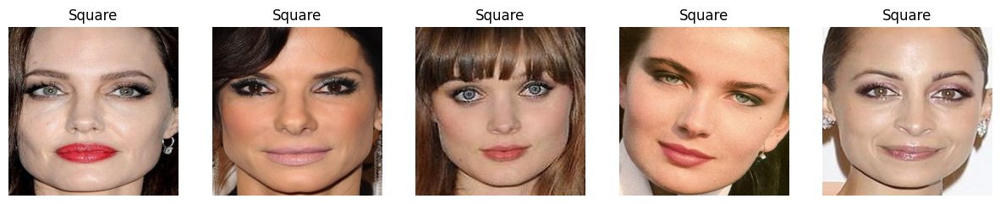

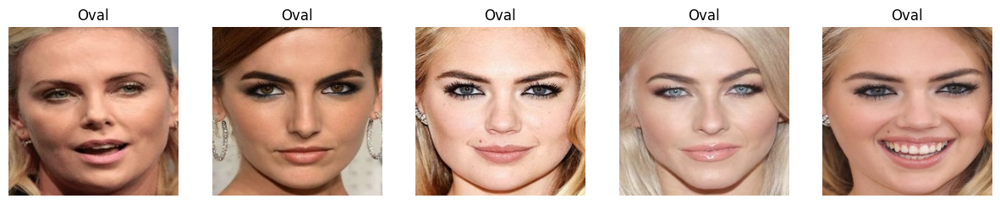

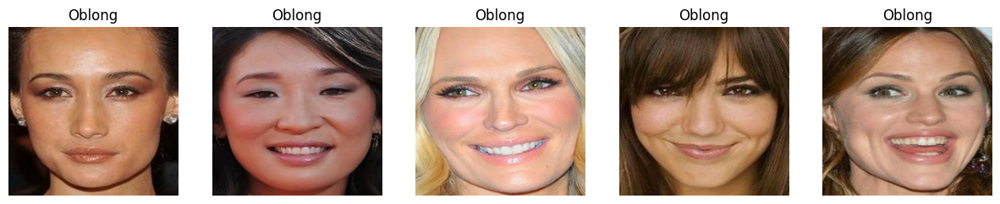

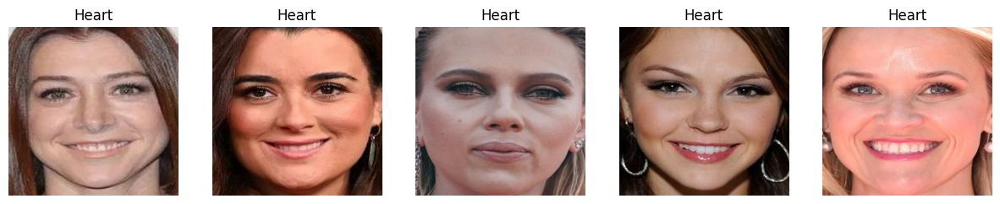

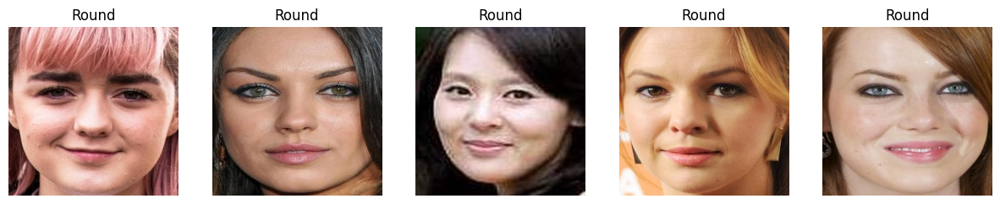

In [25]:
for skin_class in os.listdir(resized_dataset):
    show_samples(resized_dataset, skin_class)

In [26]:
# Cek Ukuran Gambar
sizes_df = check_image_sizes(resized_dataset)

        Width  Height
count  5000.0  5000.0
mean    224.0   224.0
std       0.0     0.0
min     224.0   224.0
25%     224.0   224.0
50%     224.0   224.0
75%     224.0   224.0
max     224.0   224.0


# **Data Splitting**

In [43]:
def split_dataset(source_dir, dest_dir, train_ratio=0.8):
    """
    Memisahkan dataset ke dalam folder 'train' dan 'val' dengan rasio tertentu.
    """
    print(
        f"\nMembagi dataset dari {source_dir} ke dalam train/val "
        f"dengan rasio {int(train_ratio * 100)}/{int((1 - train_ratio) * 100)}..."
    )

    # Buat folder tujuan untuk setiap split dan kelas
    classes = [
        d for d in os.listdir(source_dir)
        if os.path.isdir(os.path.join(source_dir, d))
    ]
    for split in ('train', 'val'):
        for cls in classes:
            os.makedirs(os.path.join(dest_dir, split, cls), exist_ok=True)

    # Proses per kelas secara stratified
    for cls in classes:
        class_path = os.path.join(source_dir, cls)
        all_images = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]
        random.shuffle(all_images)

        split_index = int(len(all_images) * train_ratio)
        train_images = all_images[:split_index]
        val_images = all_images[split_index:]

        # Salin file sesuai pembagian
        for split_name, images in [('train', train_images), ('val', val_images)]:
            for img_name in images:
                src = os.path.join(class_path, img_name)
                dst = os.path.join(dest_dir, split_name, cls, img_name)
                shutil.copy2(src, dst)

    print("\nPembagian dataset selesai.")

def count_images_in_folder(base_dir, split):
    """
    Menghitung jumlah gambar dalam folder 'train' dan 'val'.
    """
    path = os.path.join(base_dir, split)
    if not os.path.exists(path):
        print(f"Folder '{path}' tidak ditemukan.")
        return

    print(f"\nJumlah data di folder {split}:")
    for cls in os.listdir(path):
        cls_path = os.path.join(path, cls)
        if os.path.isdir(cls_path):
            count = len([
                f for f in os.listdir(cls_path)
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ])
            print(f"  - {cls}: {count} gambar")

In [44]:
split_dataset_path = './dataset-face-shape_split'

split_dataset(resized_dataset, split_dataset_path, train_ratio=0.8)

count_images_in_folder(split_dataset_path, 'train')
count_images_in_folder(split_dataset_path, 'val')


Membagi dataset dari ./dataset-skin-tone_resized ke dalam train/val dengan rasio 80/19...

Pembagian dataset selesai.

Jumlah data di folder train:
  - Square: 800 gambar
  - Oval: 800 gambar
  - Oblong: 800 gambar
  - Heart: 800 gambar
  - Round: 800 gambar

Jumlah data di folder val:
  - Square: 200 gambar
  - Oval: 200 gambar
  - Oblong: 200 gambar
  - Heart: 200 gambar
  - Round: 200 gambar


In [30]:
!zip -r splitted-fs-hijabist.zip ./dataset-face-shape_split
from google.colab import files
files.download('splitted-fs-hijabist.zip')

Output streaming akan dipotong hingga 5000 baris terakhir.
updating: content/dataset-skin-tone_split/train/Square/square (33).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (147).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (227).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (790).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (555).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (179).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (71).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (267).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (536).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (984).jpg (deflated 1%)
updating: content/dataset-skin-tone_split/train/Square/square (676).jpg (deflated 1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Augmentasi Data Training**

In [18]:
import zipfile

zip_path = '/content/splitted-fs-hijabist.zip'
extract_path = './'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
  print(f"Mengekstrak {zip_path} ke {extract_path}...")
  zip_ref.extractall(extract_path)
  print("Ekstraksi selesai.")

Mengekstrak /content/splitted-fs-hijabist.zip ke ./...
Ekstraksi selesai.


In [19]:
from uuid import uuid4

In [20]:
def augment_images(train_dir, target_count):
    """
    Melakukan augmentasi gambar di folder train_dir agar setiap kelas memiliki
    jumlah gambar setidaknya sebanyak target_count.
    """

    # Konfigurasi ImageDataGenerator untuk augmentasi gambar.
    augmentor = ImageDataGenerator(
    rotation_range=20,             # Rotasi
    brightness_range=(0.8, 1.2),   # Variasi pencahayaan
    fill_mode='nearest',           # Hindari padding aneh
    horizontal_flip=True           # Balik horizontal
)

    # Loop untuk setiap folder kelas di direktori pelatihan
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name)
        if not os.path.isdir(class_path):
            continue  # Lewati jika bukan direktori (misalnya file README)

        # Ambil daftar gambar asli (tanpa 'aug' di nama file) di kelas ini
        images = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.jpg', '.jpeg', '.png')) and 'aug' not in f.lower()
        ]
        current_count = len(images)  # Jumlah gambar asli saat ini

        # Jika jumlah gambar sudah mencukupi, lewati augmentasi untuk kelas ini
        if current_count >= target_count:
            print(f"Kelas '{class_name}' sudah cukup: {current_count}/{target_count}")
            continue

        needed = target_count - current_count  # Jumlah gambar yang perlu ditambahkan
        per_image_aug_count = (needed // len(images)) + 1  # Jumlah augmentasi per gambar
        augmented_count = 0  # Counter jumlah augmentasi yang telah dibuat

        print(f"\nAugmentasi kelas {class_name} ({needed} gambar dibutuhkan):")

        # Loop setiap gambar asli dan lakukan augmentasi
        for img_name in images:
            if augmented_count >= needed:
                break  # Stop jika augmentasi sudah cukup

            img_path = os.path.join(class_path, img_name)
            try:
                # Buka gambar dan ubah ke array
                img = Image.open(img_path).convert('RGB')
                img_array = np.expand_dims(np.array(img), axis=0)

                i = 0  # Counter untuk jumlah augmentasi dari gambar ini

                # Lakukan augmentasi menggunakan flow generator
                for batch in augmentor.flow(
                    img_array,
                    batch_size=1,
                    save_to_dir=None,      # Kita simpan secara manual
                    save_format='jpg'
                ):
                    # Buat nama file unik menggunakan UUID pendek
                    unique_id = uuid4().hex[:8]
                    new_filename = f"aug_{class_name}_{unique_id}.jpg"
                    save_path = os.path.join(class_path, new_filename)

                    # Simpan hasil augmentasi
                    Image.fromarray(batch[0].astype(np.uint8)).save(save_path, format='JPEG', quality=95)

                    i += 1
                    augmented_count += 1

                    # Hentikan augmentasi dari gambar ini jika sudah cukup
                    if i >= per_image_aug_count or augmented_count >= needed:
                        break

                    # Log setiap 50 gambar baru
                    if augmented_count % 50 == 0:
                        print(f"Generated: {augmented_count}/{needed}")

            except Exception as e:
                # Tangani error pada gambar yang rusak atau tidak bisa dibuka
                print(f"Error pada {img_path}: {str(e)[:50]}")

    # Cek akhir jumlah gambar per kelas setelah augmentasi
    final_count = {
        class_name: len([
            f for f in os.listdir(os.path.join(train_dir, class_name))
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ])
        for class_name in os.listdir(train_dir)
    }

    print("\nHasil akhir distribusi gambar:")
    for k, v in final_count.items():
        print(f"{k}: {v} gambar")

In [21]:
train_dir = './content/dataset-skin-tone_split/train'
augment_images(train_dir, target_count=1200)


Augmentasi kelas Square (400 gambar dibutuhkan):

Augmentasi kelas Oval (400 gambar dibutuhkan):

Augmentasi kelas Oblong (400 gambar dibutuhkan):

Augmentasi kelas Heart (400 gambar dibutuhkan):

Augmentasi kelas Round (400 gambar dibutuhkan):

Hasil akhir distribusi gambar:
Square: 1200 gambar
Oval: 1200 gambar
Oblong: 1200 gambar
Heart: 1200 gambar
Round: 1200 gambar


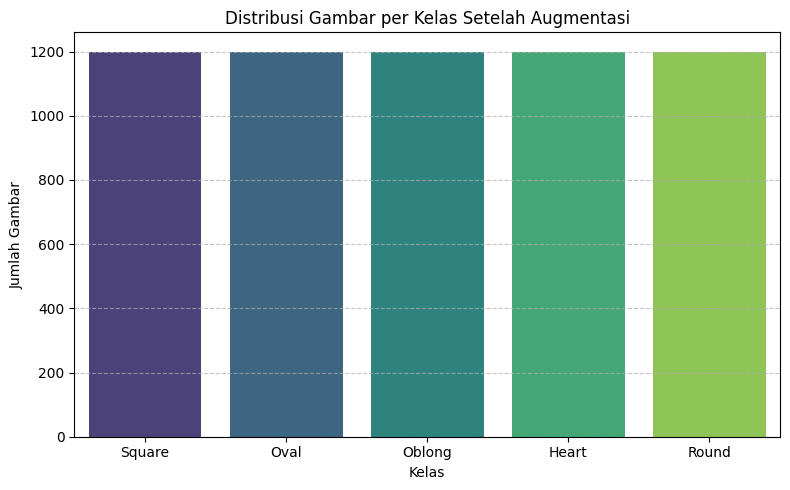

In [22]:
def plot_class_distribution(train_dir):
    """Hitung dan visualisasikan distribusi jumlah gambar per kelas"""
    final_count = {}
    classes = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

    for class_name in classes:
        class_path = os.path.join(train_dir, class_name)
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        final_count[class_name] = count

    plt.figure(figsize=(8, 5))
    sns.barplot(x=list(final_count.keys()), y=list(final_count.values()), palette='viridis')
    plt.title('Distribusi Gambar per Kelas Setelah Augmentasi')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah Gambar')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Visualisasi distribusi data
plot_class_distribution(train_dir)

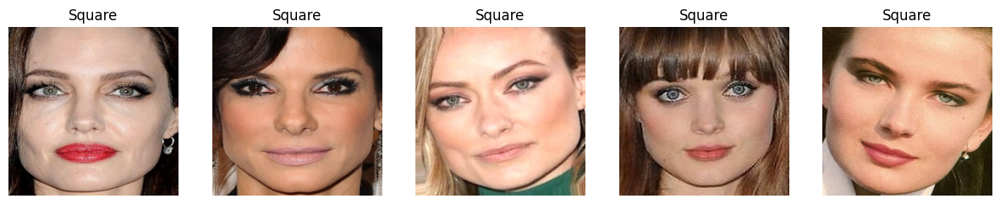

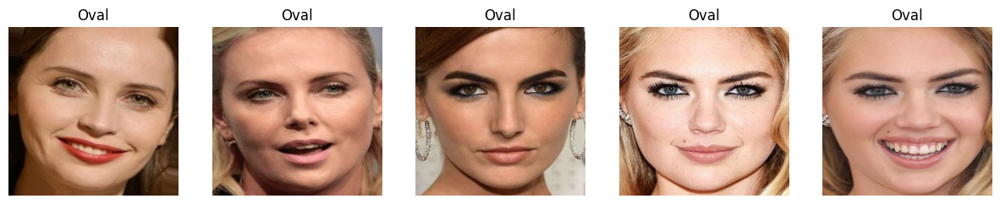

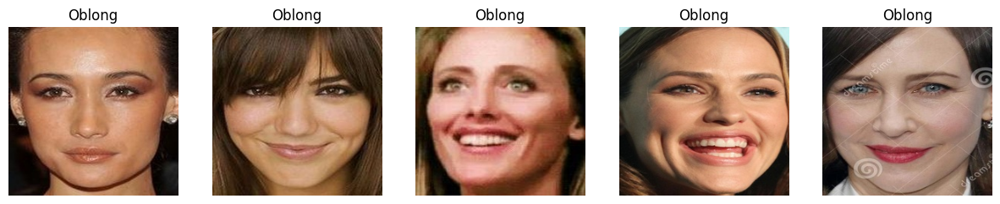

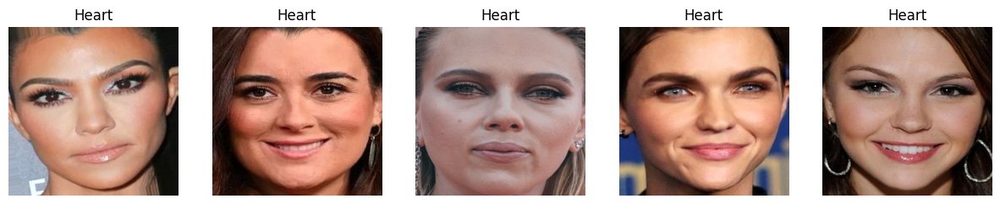

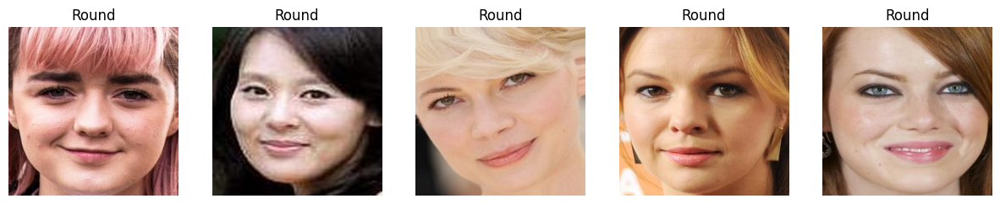

In [23]:
for skin_class in os.listdir(train_dir):
    show_samples(train_dir, skin_class)

# **Data Generator Setup**

In [24]:
# Direktori dataset
train_dir = "./content/dataset-skin-tone_split/train"
val_dir = "./content/dataset-skin-tone_split/val"

# Normalisasi pixel gambar ke [0, 1]
train_datagen = ImageDataGenerator(rescale=1.0 / 255)
val_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Data generator untuk training
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=True
)

# Data generator untuk validasi
val_generator = val_datagen.flow_from_directory(
    directory=val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

Found 6000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.


In [25]:
print(f"jumlah kelas :", len(train_generator.class_indices))
print(train_generator.class_indices)  # Mengecek jumlah kelas yang dikenali

jumlah kelas : 5
{'Heart': 0, 'Oblong': 1, 'Oval': 2, 'Round': 3, 'Square': 4}


# **Modelling**

In [119]:
# Base model MobileNet tanpa top, tapi pretrained di ImageNet
base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Set semua layer agar bisa di-fine-tune
for layer in base_model.layers:
    layer.trainable = True

# Tambahkan custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(train_generator.num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

In [108]:
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,532,741 (13.48 MB)

 Trainable params: 3,510,853 (13.39 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [107]:
model.compile(
    optimizer=AdamW(learning_rate=0.001, weight_decay=0.01),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [86]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint('model_best.keras', save_best_only=True, monitor='val_loss', verbose=1),
    ModelCheckpoint('model_best.h5', save_best_only=True, monitor='val_loss', verbose=1)
]

In [109]:
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    callbacks=callbacks
)

Epoch 1/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.2158 - loss: 1.8158
Epoch 1: val_loss did not improve from 0.55496

Epoch 1: val_loss did not improve from 0.55496
188/188 ━━━━━━━━━━━━━━━━━━━━ 65s 189ms/step - accuracy: 0.2159 - loss: 1.8149 - val_accuracy: 0.2930 - val_loss: 1.5535 - learning_rate: 0.0010
Epoch 2/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.3419 - loss: 1.4671
Epoch 2: val_loss did not improve from 0.55496

Epoch 2: val_loss did not improve from 0.55496
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - accuracy: 0.3422 - loss: 1.4667 - val_accuracy: 0.2600 - val_loss: 2.0555 - learning_rate: 0.0010
Epoch 3/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5287 - loss: 1.1838
Epoch 3: val_loss did not improve from 0.55496

Epoch 3: val_loss did not improve from 0.55496
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - accuracy: 0.5288 - loss: 1.1836 - val_accuracy: 0.4960 - val_loss: 1.2438 - learning_rate: 0.0010
Epoch 4/50
188/188 ━━

188/188 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - accuracy: 0.8809 - loss: 0.3787 - val_accuracy: 0.8280 - val_loss: 0.5230 - learning_rate: 2.0000e-04
Epoch 10/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9290 - loss: 0.2335
Epoch 10: val_loss did not improve from 0.52301

Epoch 10: val_loss did not improve from 0.52301
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.9290 - loss: 0.2335 - val_accuracy: 0.8340 - val_loss: 0.5327 - learning_rate: 2.0000e-04
Epoch 11/50
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9499 - loss: 0.1770
Epoch 11: val_loss did not improve from 0.52301

Epoch 11: val_loss did not improve from 0.52301
188/188 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.9499 - loss: 0.1770 - val_accuracy: 0.8030 - val_loss: 0.7350 - learning_rate: 2.0000e-04
Epoch 12/50
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9628 - loss: 0.1369
Epoch 12: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 12: val_loss 

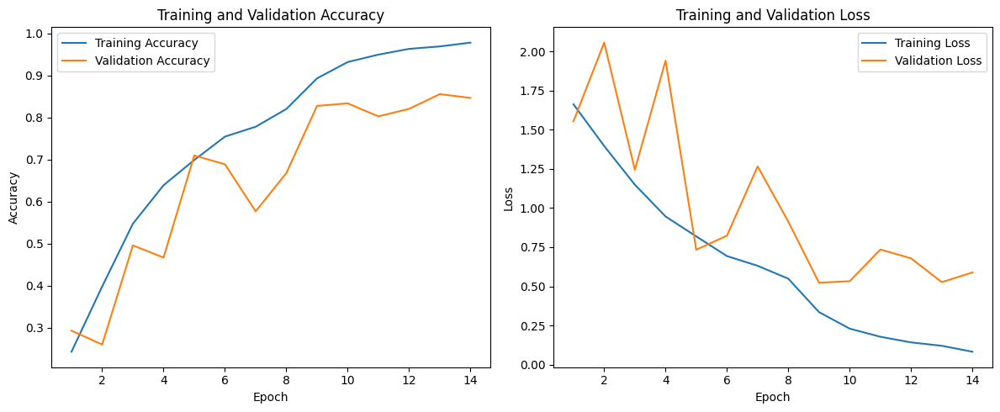

In [110]:
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))

    # Plot akurasi
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Panggil fungsi ini setelah training
plot_training_history(history)

In [111]:
# Prediksi di data validasi
val_generator.reset()
pred_probs = model.predict(val_generator)
y_pred = np.argmax(pred_probs, axis=1)
y_true = val_generator.classes
class_labels = list(val_generator.class_indices.keys())

# metrik evaluasi
acc = accuracy_score(y_true, y_pred)
prec = precision_score(y_true, y_pred, average='macro')
rec = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print(f"\n Evaluasi Model:")
print(f" - Accuracy : {acc:.4f}")
print(f" - Precision: {prec:.4f}")
print(f" - Recall   : {rec:.4f}")
print(f" - F1-Score : {f1:.4f}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step

 Evaluasi Model:
 - Accuracy : 0.8280
 - Precision: 0.8309
 - Recall   : 0.8280
 - F1-Score : 0.8284



 Classification Report:
              precision    recall  f1-score   support

       Heart       0.81      0.79      0.80       200
      Oblong       0.89      0.88      0.89       200
        Oval       0.71      0.74      0.73       200
       Round       0.91      0.81      0.85       200
      Square       0.84      0.92      0.88       200

    accuracy                           0.83      1000
   macro avg       0.83      0.83      0.83      1000
weighted avg       0.83      0.83      0.83      1000



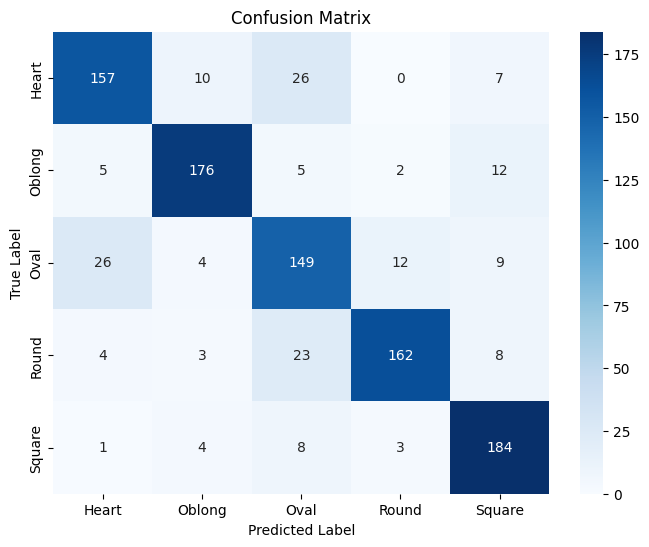

In [112]:
# Classification report
print("\n Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# **Inference**

In [43]:
import cv2
import dlib
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import tensorflow as tf
from google.colab import files

In [49]:
# Inisialisasi detektor wajah dlib
# dlib akan digunakan untuk mendeteksi lokasi wajah.
try:
    detector = dlib.get_frontal_face_detector()
    print("Detektor dlib berhasil diinisialisasi.")
except Exception as e:
    print(f"Gagal menginisialisasi dlib face detector: {e}")
    detector = None # Set detector menjadi None jika gagal

# Muat model terbaik yang sudah dilatih
# Ganti path berikut sesuai dengan lokasi dan nama file model Anda.
# Kode ini mencoba memuat format .keras terlebih dahulu, kemudian .h5 jika gagal.
model_path_keras = '/content/model_best.keras'  # Path untuk model format Keras v3
model_path_h5 = '/content/model_best.h5'      # Path untuk model format HDF5 (legacy)
model = None

if detector: # Hanya lanjut jika detektor wajah berhasil diinisialisasi
    try:
        model = tf.keras.models.load_model(model_path_keras)
        print(f"Model berhasil dimuat dari {model_path_keras}")
    except Exception as e_keras:
        print(f"Gagal memuat model dari {model_path_keras}: {e_keras}")
        print(f"Mencoba memuat dari format .h5...")
        try:
            model = tf.keras.models.load_model(model_path_h5)
            print(f"Model berhasil dimuat dari {model_path_h5}")
        except Exception as e_h5:
            print(f"Gagal memuat model dari {model_path_h5}: {e_h5}")
            print("Pastikan path model sudah benar dan file model tidak korup.")
else:
    print("Detektor wajah tidak terinisialisasi, proses inferensi tidak dapat dilanjutkan tanpa deteksi wajah.")

Detektor dlib berhasil diinisialisasi.
Model berhasil dimuat dari /content/model_best.keras


In [48]:
# Mapping indeks kelas ke nama kelas
class_labels = list(train_generator.class_indices.keys())

# Ukuran gambar yang digunakan untuk pelatihan model
target_size = (224, 224)

In [101]:
def preprocess_image(image_path, detector_dlib, predictor_path, target_size_tuple=(224, 224)):
    """
    Melakukan preprocessing lengkap pada satu gambar untuk inferensi.
    Pipeline: Baca -> Deteksi Wajah (dlib) -> Deteksi Landmark -> Crop Wajah (berbasis landmark) -> Resize -> Normalisasi.

    Args:
        image_path (str): Path ke file gambar.
        detector_dlib (dlib.frontal_face_detector): Objek detektor dlib yang sudah diinisialisasi.
        predictor_path (str): Path ke file shape_predictor_68_face_landmarks.dat.
        target_size_tuple (tuple): Ukuran target (height, width) untuk resize.

    Returns:
        numpy.ndarray: Gambar yang sudah diproses dan siap untuk model (dengan batch dimension),
                       atau None jika terjadi error.
    """
    if detector_dlib is None:
        print("Error: Detektor dlib tidak tersedia.")
        return None

    try:
        # Inisialisasi predictor
        predictor = dlib.shape_predictor(predictor_path)

        # 1. Baca gambar menggunakan OpenCV
        img = cv2.imread(image_path)
        if img is None:
            print(f"Error: Gambar tidak dapat dibaca dari {image_path}. Pastikan path benar dan file tidak korup.")
            return None

        # 2. Konversi gambar ke grayscale (untuk dlib detector)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # 3. Deteksi wajah menggunakan dlib
        faces = detector_dlib(gray)

        if not faces:
            print(f"Peringatan: Tidak ada wajah terdeteksi pada gambar {os.path.basename(image_path)}.")
            return None # Kembalikan None jika tidak ada wajah

        # 4. Ambil wajah pertama yang terdeteksi (asumsi satu wajah utama per gambar)
        face = faces[0]

        # 5. Deteksi landmark wajah
        landmarks = predictor(gray, face)
        points = np.array([(landmarks.part(i).x, landmarks.part(i).y) for i in range(68)])

        # 6. Logika Cropping Wajah Berdasarkan Landmark dlib
        # (Menggunakan logika yang sama seperti skrip cropping data training Anda)
        jaw = points[0:17]
        chin = points[8]
        forehead_center = (points[27][0], points[27][1] - int(abs(points[8][1] - points[27][1]) * 0.6))  # Estimasi dahi

        # Buat bounding box dari atas dahi ke dagu (panjang wajah)
        x1 = min(jaw[:, 0].min(), forehead_center[0]) - 10
        x2 = max(jaw[:, 0].max(), forehead_center[0]) + 10
        y1 = forehead_center[1] - 25
        y2 = chin[1] + 10

        # Clamp ke ukuran gambar
        x1, x2 = max(0, x1), min(img.shape[1], x2)
        y1, y2 = max(0, y1), min(img.shape[0], y2)

        # Crop bagian wajah yang menyertakan dahi hingga dagu
        cropped_img = img[y1:y2, x1:x2]

        if cropped_img.size == 0:
             print(f"Peringatan: Area cropping kosong untuk gambar {os.path.basename(image_path)}.")
             return None

        # 7. Resize gambar yang sudah di-crop
        # Pastikan gambar dalam format RGB sebelum resize
        cropped_img_rgb = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)
        resized_img = Image.fromarray(cropped_img_rgb).resize(target_size_tuple, Image.Resampling.LANCZOS if hasattr(Image, 'Resampling') else Image.LANCZOS)
        resized_img_array = np.array(resized_img)


        # 8. Normalisasi pixel gambar ke [0, 1]
        normalized_img = resized_img_array.astype('float32') / 255.0

        # 9. Tambahkan batch dimension (karena model mengharapkan input dalam bentuk batch)
        processed_img = np.expand_dims(normalized_img, axis=0)

        return processed_img

    except Exception as e:
        print(f"Error saat memproses gambar {os.path.basename(image_path)}: {e}")
        return None

In [53]:
def predict_face_shape(image_path, model_loaded, class_labels_list, detector_for_preprocess, predictor_path_for_preprocess, target_size_tuple=(224, 224)):
    """
    Memproses gambar baru, melakukan prediksi face shape menggunakan model,
    dan menampilkan hasil prediksi beserta gambar.
    """
    if model_loaded is None:
        print("Error: Model belum berhasil dimuat. Tidak bisa melakukan prediksi face shape.")
        return
    if detector_for_preprocess is None:
        print("Error: Detektor dlib tidak tersedia untuk preprocessing.")
        return
    if predictor_path_for_preprocess is None:
        print("Error: Path predictor dlib tidak tersedia untuk preprocessing.")
        return

    # Preprocess gambar input
    print(f"Memproses gambar untuk prediksi face shape: {os.path.basename(image_path)}...")
    processed_image_batch = preprocess_image(image_path, detector_for_preprocess, predictor_path_for_preprocess, target_size_tuple)

    if processed_image_batch is None:
        print("Preprocessing gambar gagal. Tidak bisa melanjutkan prediksi face shape.")
        # Tampilkan gambar original jika preprocessing gagal sebagai referensi
        try:
            img_original_pil = Image.open(image_path)
            plt.figure(figsize=(5, 5))
            plt.imshow(img_original_pil)
            plt.title(f"Original Image (Preprocessing Gagal):\n{os.path.basename(image_path)}")
            plt.axis('off')
            plt.show()
        except Exception as e_disp:
            print(f"Gagal menampilkan gambar original: {e_disp}")
        return

    # Lakukan prediksi menggunakan model
    print("Melakukan prediksi face shape...")
    predictions_batch = model_loaded.predict(processed_image_batch) # Outputnya adalah array probabilitas per kelas

    # Ambil probabilitas untuk gambar pertama dalam batch (karena kita proses 1 gambar)
    predictions_single = predictions_batch[0]

    # Ambil indeks kelas dengan probabilitas tertinggi
    predicted_class_index = np.argmax(predictions_single)

    # Dapatkan nama label kelas yang diprediksi
    # Pastikan class_labels_list tidak kosong dan indeks valid
    if not class_labels_list or predicted_class_index >= len(class_labels_list):
         predicted_label = "Tidak Diketahui (Indeks Kelas Invalid)"
         print(f"Peringatan: Indeks kelas prediksi ({predicted_class_index}) di luar jangkauan class_labels_list ({len(class_labels_list)})")
    else:
        predicted_label = class_labels_list[predicted_class_index]

    # Tampilkan hasil prediksi face shape
    print(f"Hasil Prediksi Face Shape: {predicted_label} (Probabilitas: {predictions_single[predicted_class_index]:.4f})")

    # Tampilkan probabilitas lengkap untuk semua kelas
    print("Probabilitas per kelas:")
    for i, prob in enumerate(predictions_single):
        label = class_labels_list[i] if i < len(class_labels_list) else f"Kelas_{i}"
        print(f"  - {label}: {prob:.4f}")

    # Tampilkan gambar yang sudah diproses (untuk verifikasi visual)
    try:
        # Ambil gambar yang sudah diproses dari batch (hapus batch dimension)
        processed_img_display = (processed_image_batch[0] * 255).astype(np.uint8)

        plt.figure(figsize=(5, 5))
        plt.imshow(processed_img_display)
        plt.title(f"Processed Image & Face Shape Prediction:\n{predicted_label} ({predictions_single[predicted_class_index]:.2f})")
        plt.axis('off')
        plt.show()
    except Exception as e_disp:
        print(f"Gagal menampilkan gambar yang sudah diproses: {e_disp}")

In [54]:
def upload_and_predict_colab(model_to_use, labels_list, detector_obj, predictor_path_obj, size_tuple=(224, 224)):
    """
    Meminta pengguna mengunggah satu atau beberapa gambar melalui antarmuka Colab,
    menyimpannya sementara, melakukan prediksi, lalu menghapusnya.
    """
    if model_to_use is None or detector_obj is None or predictor_path_obj is None:
        print("Model, Detektor dlib, atau Predictor dlib belum siap. Unggah dibatalkan.")
        return

    print("Silakan unggah gambar Anda (bisa lebih dari satu):")
    try:
        uploaded_files_dict = files.upload() # Menampilkan dialog upload Colab

        if not uploaded_files_dict:
            print("Tidak ada file yang diunggah.")
            return

        for file_name in uploaded_files_dict.keys():
            print(f'\nMemproses file unggahan: "{file_name}" ({len(uploaded_files_dict[file_name])} bytes)')

            # Simpan file yang diunggah ke _file system_ sementara Colab agar bisa dibaca path-nya
            temp_image_path = file_name
            with open(temp_image_path, 'wb') as f:
                f.write(uploaded_files_dict[file_name])

            # Lakukan prediksi pada gambar yang diunggah
            # Menggunakan fungsi predict_face_shape yang sudah disesuaikan
            predict_face_shape(temp_image_path, model_to_use, labels_list, detector_obj, predictor_path_obj, size_tuple)

            # Hapus file lokal setelah selesai diproses (opsional, untuk kebersihan)
            try:
                os.remove(temp_image_path)
                print(f"File sementara '{temp_image_path}' telah dihapus.")
            except Exception as e_remove:
                print(f"Gagal menghapus file sementara '{temp_image_path}': {e_remove}")
    except Exception as e_upload:
        print(f"Terjadi error saat proses unggah atau prediksi: {e_upload}")


 MEMULAI SESI UNGGAH DAN PREDIKSI GAMBAR BARU 
Silakan unggah gambar Anda (bisa lebih dari satu):


Saving brown-fringe-long-layers-indigital-tory_burch_702_fw15.jpg to brown-fringe-long-layers-indigital-tory_burch_702_fw15.jpg

Memproses file unggahan: "brown-fringe-long-layers-indigital-tory_burch_702_fw15.jpg" (811998 bytes)
Memproses gambar untuk prediksi face shape: brown-fringe-long-layers-indigital-tory_burch_702_fw15.jpg...
Melakukan prediksi face shape...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Hasil Prediksi Face Shape: Oval (Probabilitas: 0.5150)
Probabilitas per kelas:
  - Heart: 0.4488
  - Oblong: 0.0212
  - Oval: 0.5150
  - Round: 0.0123
  - Square: 0.0027


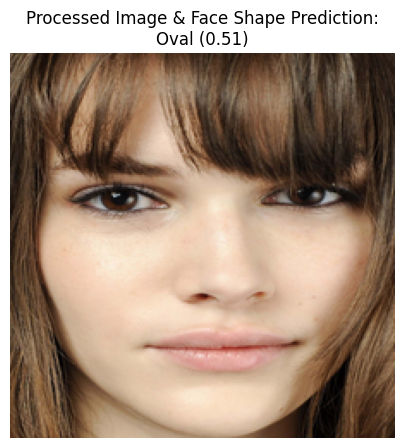

File sementara 'brown-fringe-long-layers-indigital-tory_burch_702_fw15.jpg' telah dihapus.


In [118]:
if model is not None and detector is not None:
    print("\n===================================================")
    print(" MEMULAI SESI UNGGAH DAN PREDIKSI GAMBAR BARU ")
    print("===================================================")
    # Path ke file shape_predictor_68_face_landmarks.dat
    predictor_path = 'shape_predictor_68_face_landmarks.dat'

    # Periksa apakah file predictor ada sebelum memanggil fungsi
    if os.path.exists(predictor_path):
        upload_and_predict_colab(model, class_labels, detector, predictor_path, target_size)
    else:
        print(f"\nError: File predictor '{predictor_path}' tidak ditemukan.")
        print("Tidak dapat melanjutkan. Pastikan predictor sudah diunduh dan diekstrak dengan benar.")

else:
    print("\nModel atau Detektor dlib tidak berhasil dimuat/diinisialisasi.")
    print("Tidak dapat melanjutkan ke proses unggah dan prediksi.")
    print("Silakan periksa pesan error pada bagian inisialisasi di atas.")